# Build a Very Own MSA Dudes👨🏾 and Food🍔 Chatbot

A chat bot that can answer questions with context from the whatsapp chat.

### Methodology
LangChain + OpenAI + Retrieval Augmented Generation

### What we will Learn Today
1. LangChain basics
2. Chains
3. TextSplitters
4. Text Vector Embeddings
5. Retreival Augmented Generation

In [ ]:
# Run the following commands to set up your environment
%pip install --quiet --upgrade langchain langchain-community langchain-chroma langchain-openai langchain-groq graphviz

In [1]:
from dotenv import load_dotenv
import os

# Load environment variables from .env file
load_dotenv()
%load_ext autoreload

In [37]:
from langchain import hub
from langchain_chroma import Chroma
from langchain_openai import ChatOpenAI
from langchain_community.document_loaders import WhatsAppChatLoader
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough
from langchain_openai import OpenAIEmbeddings
from langchain_text_splitters import RecursiveCharacterTextSplitter
from langchain_core.prompts import ChatPromptTemplate

llm = ChatOpenAI(model="gpt-4o")
# Load, chunk and index the contents of the blog.
whatsapp_loader = WhatsAppChatLoader(path="./chat_formatted.txt")
docs = whatsapp_loader.load()

text_splitter = RecursiveCharacterTextSplitter(chunk_size=2000, chunk_overlap=300)
splits = text_splitter.split_documents(docs)
vectorstore = Chroma.from_documents(documents=splits, embedding=OpenAIEmbeddings())

# Retrieve and generate using the relevant snippets of the blog.
retriever = vectorstore.as_retriever(search_kwargs={"k": 30})
prompt = ChatPromptTemplate.from_template(
    """
    You are an assistant for question-answering tasks. Use the following pieces of retrieved context to answer the question. Try your best to answer all questions.
    Question: {question} 
    Context: {context} 
    Answer:
    """
)


def format_docs(docs):
    return "\n\n".join(doc.page_content for doc in docs)


rag_chain = (
    {"context": retriever | format_docs, "question": RunnablePassthrough()}
    | prompt
    | llm
    | StrOutputParser()
)

rag_chain.invoke("What are some of the funniest things said in the chat?")

'Here are some of the funniest things said in the chat:\n\n1. When the chat reopened, Rameez R humorously asked Sualeh Syed, "Bro were u staring at the chat waiting for it to open," followed by Tahir\'s comment, "Bro was refreshing his screen."\n\n2. A light-hearted exchange about hamsters included Sualeh Syed\'s joke, "Imagine being named after a hamster," and Tahir adding, "Imagine being at a place that\'s named after a hamster."\n\n3. A humorous misunderstanding involved Abdullah Kobir\'s statement, "One must know what being gay is in order to classify it in a chat 🤓," leading to playful banter about who is the "least gay" in the chat.\n\n4. The playful comment by Yusuf Quadri, "Guys some bidets are like lasers man," and Omar Jaafar\'s follow-up, "Don’t use the bidet in the jordan airport," injected humor into a mundane topic.\n\n5. A funny moment occurred when Yusuf Quadri said, "I can bench you sunan watch out," leading to a playful challenge in the chat.\n\nThese snippets highlig

In [42]:
rag_chain.invoke("what are some things said by Zaeem Ahmed")

'Based on the provided context, here are some things said by Zaeem Ahmed:\n\n1. "Say less" - This was mentioned in response to a conversation about gathering people for a cricket team.\n2. "Yessir" - This was a response to a question or statement that is not fully visible in the context provided.\n3. "Shayan said MSA guys just sit at SC and don’t do shit" - This was mentioned in a conversation related to the MSA (Muslim Student Association).\n\nThese are the direct quotes from Zaeem Ahmed based on the snippets provided in the context.'

# We Will Learn to Build this Chatbot using something called Retrieval Augmented Generation (RAG)

![image copy.png](<attachment:image copy.png>)
![image copy 2.png](<attachment:image copy 2.png>)
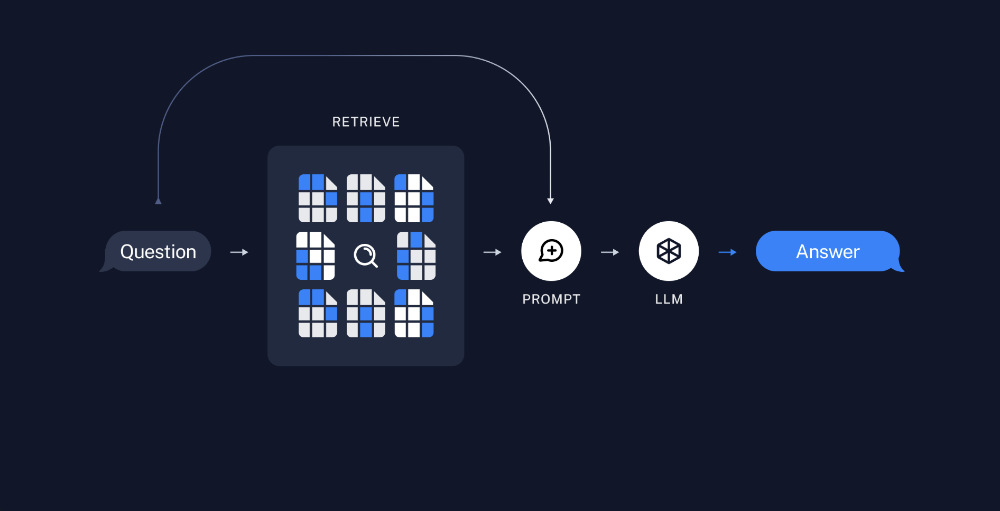
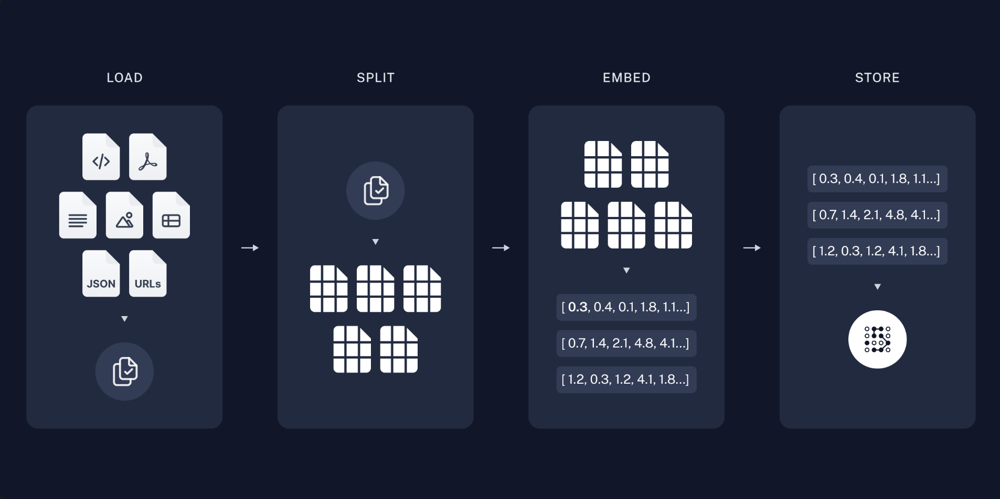

# What is Langchain?
A **Framework** to run and use LLMs to perform tasks. Using Langchain to orchestrate these tasks is much easier and standardized than using libraries yourself.

- LLM Chains
- LLM Agents
- Vector Databases


In [3]:
from langchain_openai import ChatOpenAI
llm = ChatOpenAI(model="gpt-4o")
llm.invoke("Hey!")

AIMessage(content='Hello! How can I assist you today?', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 9, 'prompt_tokens': 9, 'total_tokens': 18, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 0, 'rejected_prediction_tokens': 0}, 'prompt_tokens_details': {'audio_tokens': 0, 'cached_tokens': 0}}, 'model_name': 'gpt-4o-2024-08-06', 'system_fingerprint': 'fp_7f6be3efb0', 'finish_reason': 'stop', 'logprobs': None}, id='run-313bbc75-8d26-4d2c-b474-8db3a3174aa9-0', usage_metadata={'input_tokens': 9, 'output_tokens': 9, 'total_tokens': 18, 'input_token_details': {'audio': 0, 'cache_read': 0}, 'output_token_details': {'audio': 0, 'reasoning': 0}})

In [4]:
from langchain_groq import ChatGroq
# SOME FREE ALTERNATIVES ARE BELOW

# Mixtral
chat_mixtral = ChatGroq(model_name="mixtral-8x7b-32768")
print("Mixtral Output:", chat_mixtral.invoke("Hello").content, "\n")

# Llama
chat_llama = ChatGroq(model_name="llama3-70b-8192")
print("Llama output:", chat_llama.invoke("Hello").content)

Mixtral Output: Hello! How can I help you today? If you have any questions about programming, web development, or data science, feel free to ask. I'll do my best to provide a clear and helpful answer. 😊 

Llama output: Hello! It's nice to meet you. Is there something I can help you with, or would you like to chat?


# 1. What's the First Thing We Should Do?
what about... maybe getting the data?

![image copy 4.png](<attachment:image copy 4.png>)
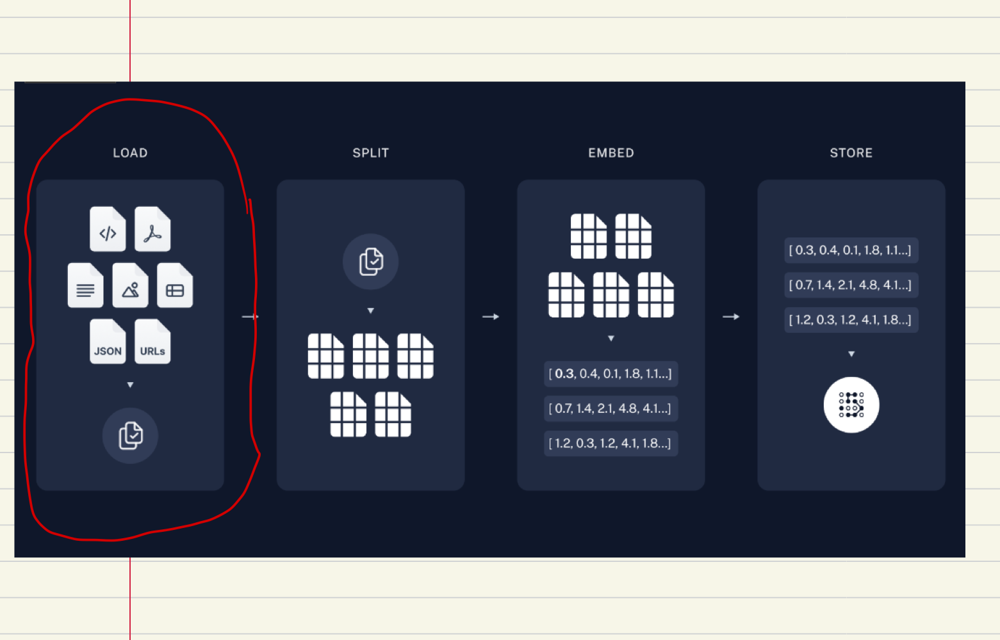

# TextLoaders
- langchain has several ways to load in the data that you want
- web loaders
- youtube transcript loaders
- pdf, word, doc loaders

We will be using their Whatsapp loader!

In [5]:
from langchain_community.document_loaders import WhatsAppChatLoader
# Load, chunk and index the contents of the blog.
whatsapp_loader = WhatsAppChatLoader(path="./chat_formatted.txt")
docs = whatsapp_loader.load()
docs[0].page_content

'~\u202fIshaq on 8/24/23, 1:05:53\u202fPM: did anyone take cs 1331 online w/ Omojokun, or is in it now? How is it?\n\n~\u202fLemon Pepper Hoom on 8/24/23, 1:14:25\u202fPM: @16784880988 took it fall 2021\n\n~\u202fZain Ghazanfar on 8/24/23, 1:27:20\u202fPM: Took it last semester with him. Exams are pretty easy as long as you watch the videos and actually do the hws (don’t copy off github 😭)\n\n~\u202fMirza Zuhayr on 8/24/23, 1:28:15\u202fPM: Free shirts in Smithgall building next to student center, only large tho\n\n~\u202fAbdullah Bazz on 8/24/23, 1:35:46\u202fPM: does anyone know what bus goes from east campus to west ?\n\n~\u202fAbdullah Bazz on 8/24/23, 1:35:51\u202fPM: i have class at howey\n\n~\u202fZain Ghazanfar on 8/24/23, 1:36:43\u202fPM: Downlod transloc\n\n~\u202fZain Ghazanfar on 8/24/23, 1:36:48\u202fPM: Itll tell u all of the routes\n\n~\u202fNabhan on 8/24/23, 1:37:12\u202fPM: download the bus app!\n\n~\u202fAbdullah Bazz on 8/24/23, 1:37:52\u202fPM: bet thank y’all\n\n~

# Now we have the data, so what's next?
*Can we just copy paste the chat and feed it into chat gpt? Let's see...*

In [6]:
print("# of characters in the entire chat:", len(docs[0].page_content))
print("# of words in the entire chat:", len(docs[0].page_content.split()))

# of characters in the entire chat: 3104033
# of words in the entire chat: 552599


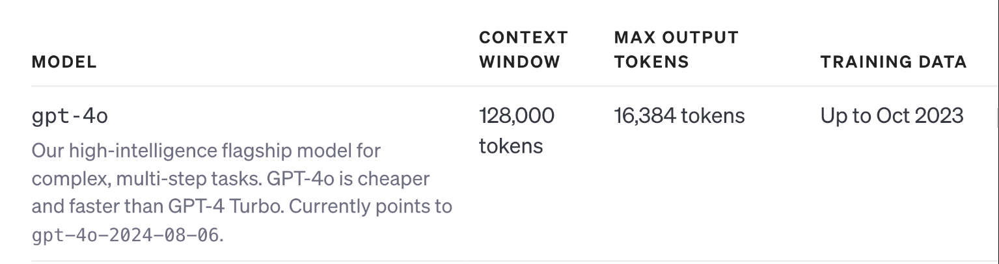

In [7]:
import tiktoken

model = "gpt-4o"  # Replace with the model you are using
encoding = tiktoken.encoding_for_model(model)

# Tokenize the string
tokens = encoding.encode(docs[0].page_content)
# Print tokens and their count
print(f"First 10 Tokens: {tokens[:10]}")
print(f"Number of tokens: {len(tokens)}")

First 10 Tokens: [93, 35971, 40, 1116, 12026, 402, 220, 23, 14, 1494]
Number of tokens: 1331016


Our word count is 552,599
Our token count is 1.3M

* The chat text is about 7.5x bigger than chat gpts context!*


### What do you do when the amount of "context" doesn't fit in the context length of the model you are using? in our case it's 128k!


Maybe our query that we ask doesn't need the entire data right?
So... what if we only sent relevant parts or "chunks" of the data to our LLM? 

First step, we will chunk the data

![image copy 5.png](<attachment:image copy 5.png>)
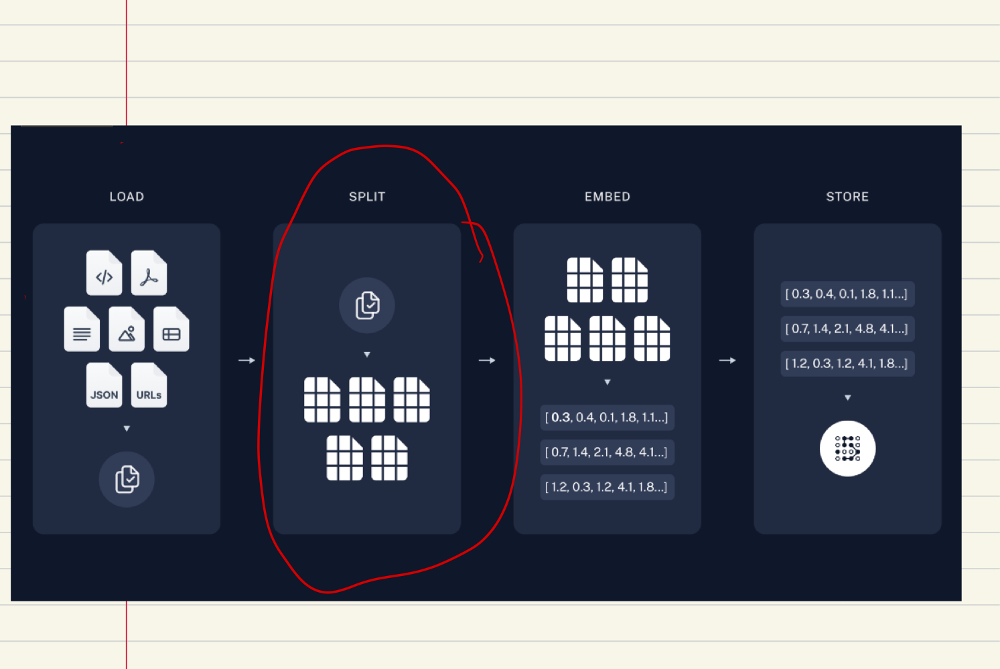

### Text Splitters: The LangChain Way to split text

Several different splitters
- CharacterTextSplitter: Split when chunk reaches X # of characters
- RecursiveCharacterTextSplitter: Split when chunk reaches X # of characters, BUT make sure to split in the last "\n"

![image copy 11.png](<attachment:image copy 11.png>)
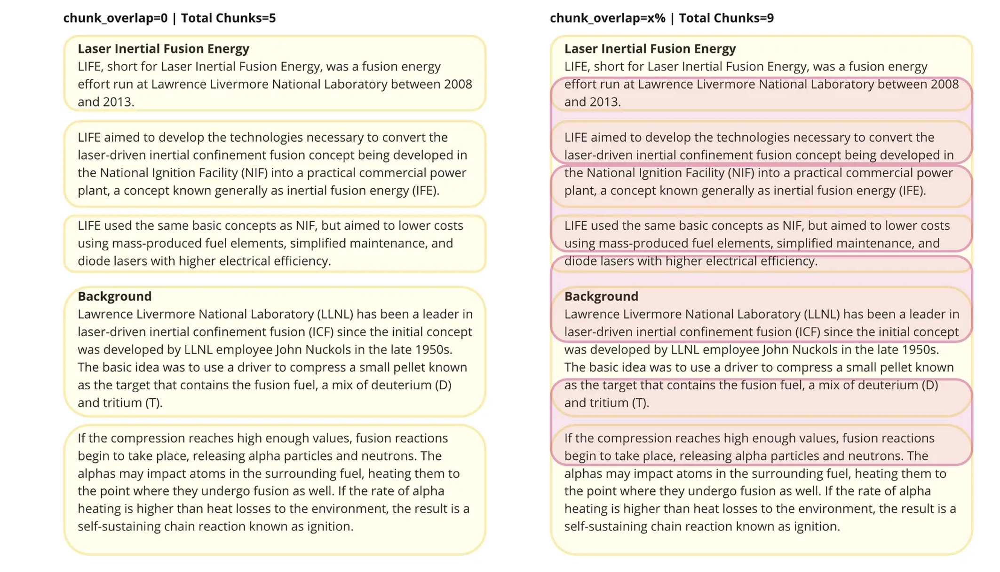

In [8]:
from langchain_text_splitters import RecursiveCharacterTextSplitter

# Chunk Size is the limit for the number of characters / chunk
# Chunk overlap is how many characters from the previous chunk included in the current chunk. Used so that context, thoughts are not broken from chunk to chunk.
text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200)
splits = text_splitter.split_documents(docs)

# add visual for chunk overlap
print("# of chunks:", len(splits), "\n")
print(splits[4].page_content)

# of chunks: 3889 

Rameez R on 8/26/23, 1:52:45 AM: Happy bday

~ Sajjaad Khader on 8/26/23, 10:04:28 AM: http://Vsco.co/arhumkhan1

~ Tawfiq Aliu on 8/26/23, 10:09:16 AM: Happy bd @bhavi

~ Usman Asif on 8/26/23, 10:09:44 AM: happy @14753230757

~ Lemon Pepper Hoom on 8/26/23, 10:18:15 AM: Happy bday @bhavi

~ Hasan G on 8/26/23, 10:18:17 AM: Happy Birthday!!

~ Lemon Pepper Hoom on 8/26/23, 10:23:38 AM: Try Airbnb

~ Lemon Pepper Hoom on 8/26/23, 10:23:58 AM: Or a hotel

~ Lemon Pepper Hoom on 8/26/23, 10:24:24 AM: Or live with @14048938728

~ Muzammil Motiwala on 8/26/23, 10:24:55 AM: We need to get @16786432791 a new hoodie

~ UmarManzoor on 8/26/23, 10:25:17 AM: Salam, someone is coming to visit tech and needs a place to stay for 2 weeks, they are willing to pay.

~ UmarManzoor on 8/26/23, 10:25:36 AM: This is his Instagram if anyone wants to reach out

~ Tawhid on 8/26/23, 10:28:04 AM: happy birthday!!

~ Haaris Jilani on 8/26/23, 11:51:54 AM: Happy birthday bhavman


![image copy 3.png](<attachment:image copy 3.png>)
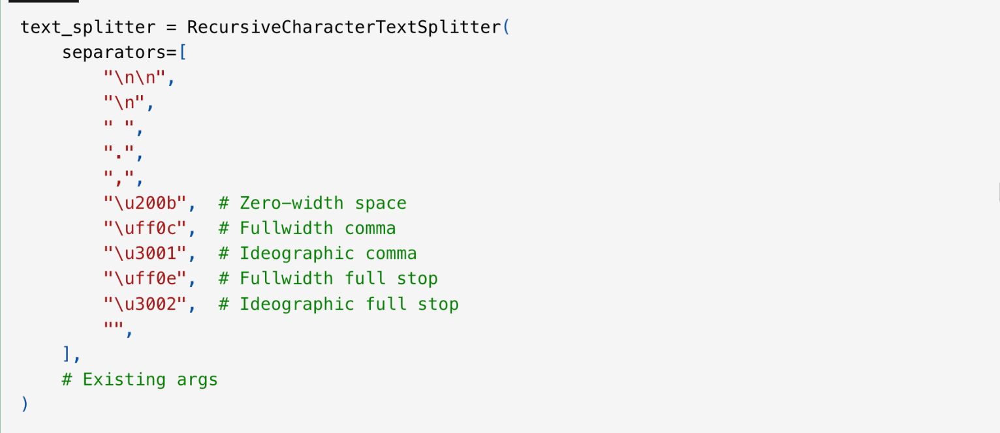

#### Now we have 3889 chunks!
But there is still a big problem. Given a query, like ```What's tawhids favourite topic to talk about in the MSA chat```, how are we going to best CHOOSE which of these 3889 chunks to send as our context to our LLM? 


It would be super cool to somehow find similar chunks based on the question right? How can we find these similar chunks?

hmm... but how can we get a computer to find similar words? It doesn't really have a brain.

### But what can computers understand?

1324234, 13432142, 1342342, 2332423

NUMBERS!!🎊🎊🎊

In [9]:
# we saw the notion of tokens right? what are tokens? why does chat gpt charge you based on "tokens" instead of words?

print(f"First 10 Tokens: {tokens[:10]}")
print(f"Number of tokens: {len(tokens)}")

First 10 Tokens: [93, 35971, 40, 1116, 12026, 402, 220, 23, 14, 1494]
Number of tokens: 1331016


# What are Tokens?
Let's try to figure out how we can maybe turn numbers into words. Any thoughts?

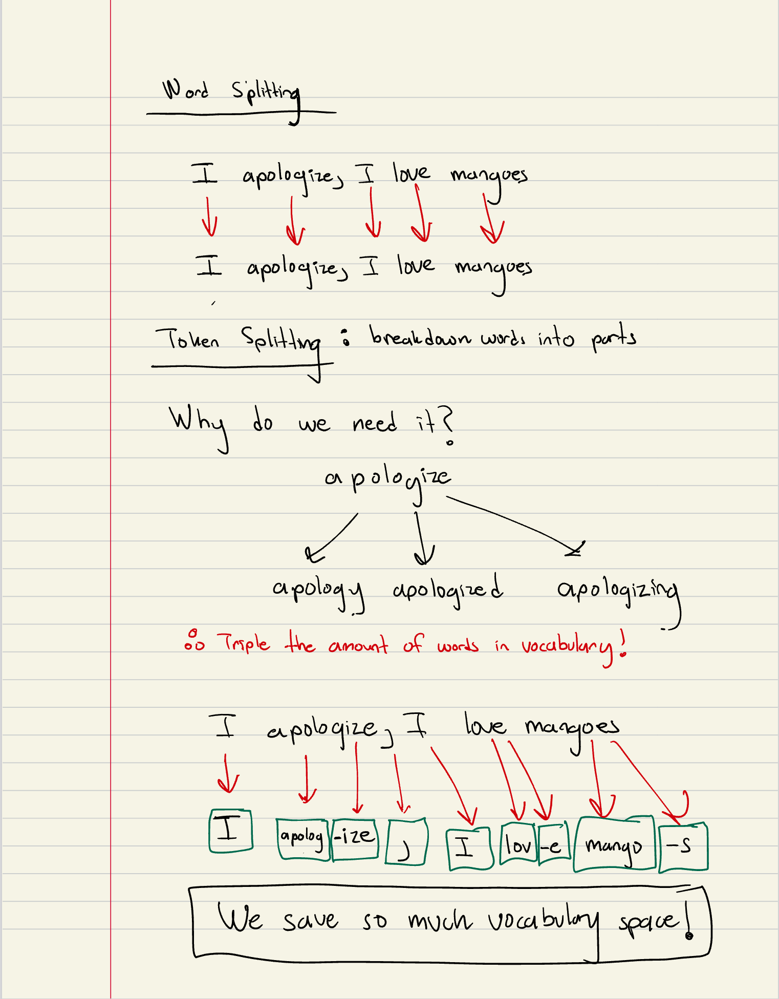



### Okay cool... But tokens still aren't numbers. So, what do we do?

what if we assigned each token a ________

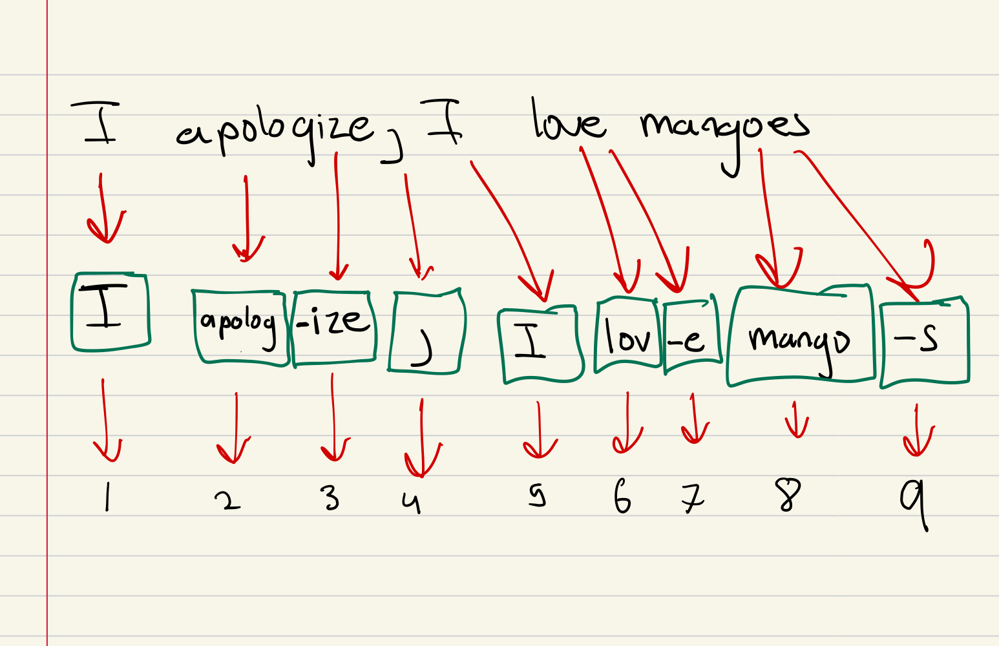

## BAM!
These tokens are now numbers. What now?
How do we know that "lov" which is represented by token 6, and for example "apolog" is represented by token 2 are SIMILAR or NOT SIMILAR?

i.e positive relationship between 6 and 2, or negative relationship between 8 (mango) and 6

### Are id's the best way to represent these words?
I mean you can argue "oh have the words "like", "love" be like index 4, 5 while hate as index "1000". But are the meaning of words *just* separated because of positive or negative tones?

what about different topics, emotions, categories, science, fiction? How do we encode all of this meaning of words?

Maybe instead of just one dimension of ids. What if we had many many different dimensons...

# Vector Embeddings
Ahh... Now we are talking!! We can possibly assign each word to a vector!

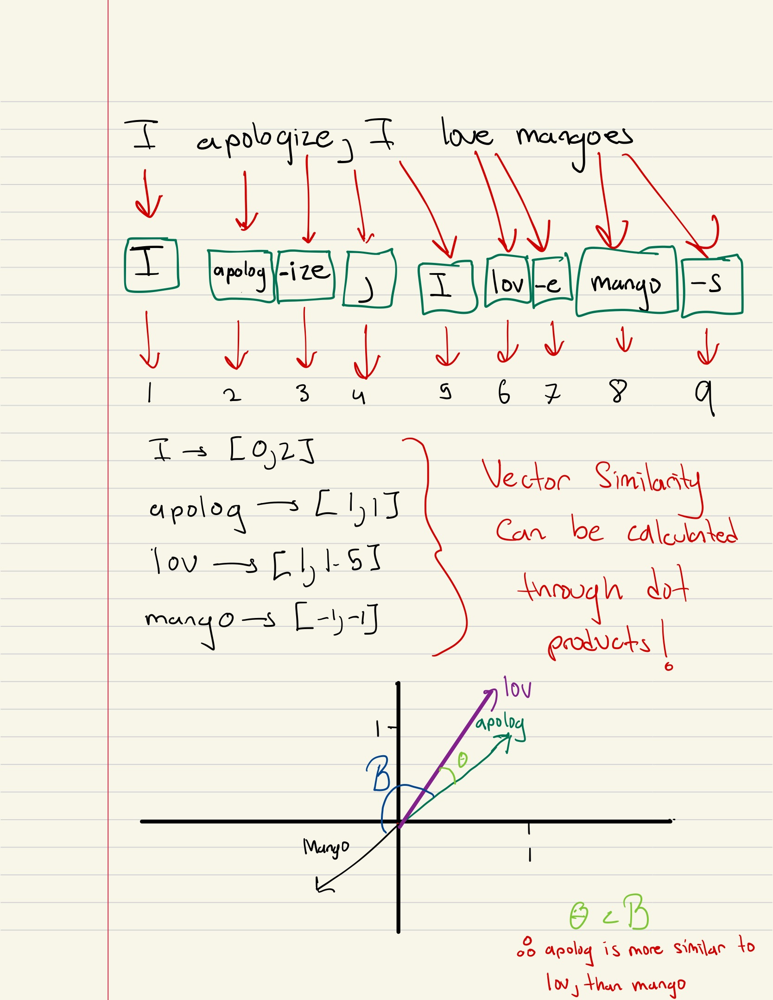

By formulating the vector embedding of words in a way where similar word vectors are CLOSER together and a-similar words are farther apart, we are able to encapsulate the meaning of words in a given vocabulary!

### Now... What if I told you, that this "dot product" operation to find similar words is the heart of ChatGPT? 🤯🤯🤯
Paper: [Attention is All You Need](https://arxiv.org/pdf/1706.03762)

#### Let's calculate the embedding values of our chunks!

![image copy 6.png](<attachment:image copy 6.png>)
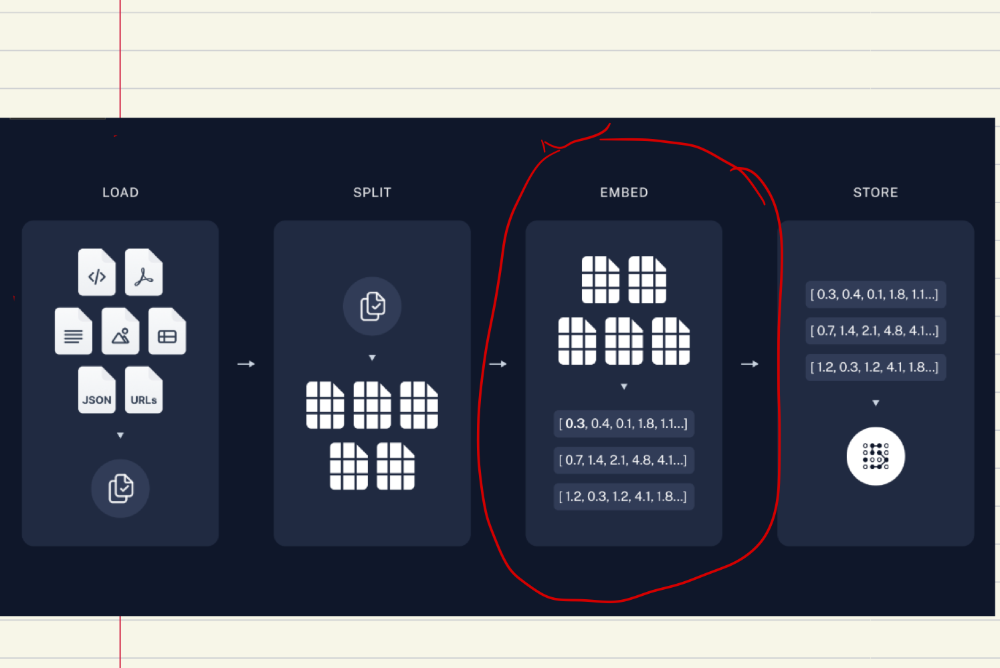

In [10]:
from langchain_openai import OpenAIEmbeddings

embedding_model = OpenAIEmbeddings()
texts = [doc.page_content for doc in splits]
embeddings = embedding_model.embed_documents(texts)

In [17]:
print("first chunk:", splits[0], "\n")
print("embedding for first chunk:", embeddings[0])
print("embedding for first chunk:", len(embeddings[0]))

first chunk: page_content='~ Ishaq on 8/24/23, 1:05:53 PM: did anyone take cs 1331 online w/ Omojokun, or is in it now? How is it?

~ Lemon Pepper Hoom on 8/24/23, 1:14:25 PM: @16784880988 took it fall 2021

~ Zain Ghazanfar on 8/24/23, 1:27:20 PM: Took it last semester with him. Exams are pretty easy as long as you watch the videos and actually do the hws (don’t copy off github 😭)

~ Mirza Zuhayr on 8/24/23, 1:28:15 PM: Free shirts in Smithgall building next to student center, only large tho

~ Abdullah Bazz on 8/24/23, 1:35:46 PM: does anyone know what bus goes from east campus to west ?

~ Abdullah Bazz on 8/24/23, 1:35:51 PM: i have class at howey

~ Zain Ghazanfar on 8/24/23, 1:36:43 PM: Downlod transloc

~ Zain Ghazanfar on 8/24/23, 1:36:48 PM: Itll tell u all of the routes

~ Nabhan on 8/24/23, 1:37:12 PM: download the bus app!

~ Abdullah Bazz on 8/24/23, 1:37:52 PM: bet thank y’all

~ Ishaq on 8/24/23, 1:55:51 PM: ahhh ok, thank you!!' metadata={'source': 'chat_formatted.txt'}

Finally, we need a way to store these embeddings somewhere...

![image copy 9.png](<attachment:image copy 9.png>)

## Vector Databases
- A database that literally holds these embedding values
- also can hold some metadata about these embeddings, but the general purpose is so that it can:
  - hold embedding values
  - perform similarity matching between embeddings through cosine similarity, eucledian distance, etc and more

![image copy 7.png](<attachment:image copy 7.png>)
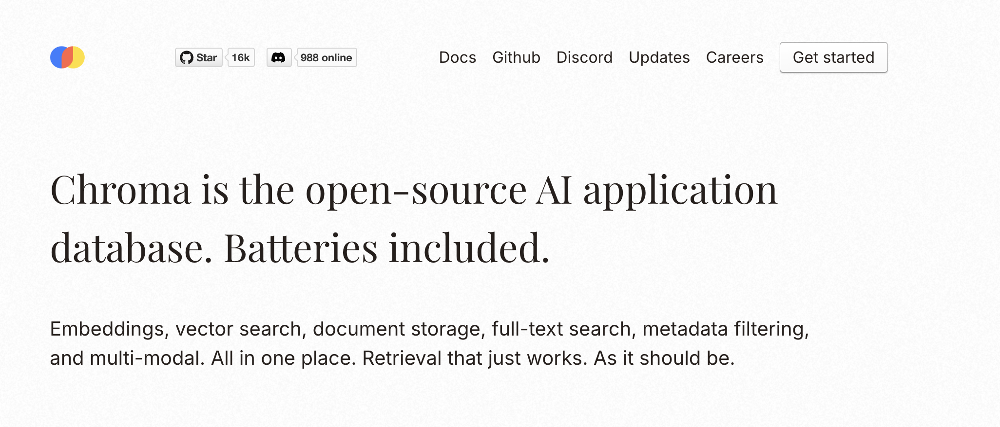

In [22]:
from langchain_chroma import Chroma
vectorstore = Chroma.from_documents(documents=splits, embedding=embedding_model)

### Convert the Vector Store to a LangChain Retriever
a retriever is a wrapper around a vectordb as it does a lot of the utility functions such as the following:
- converting a query to an embedding
- performing different similarity searches (cosine, eucledian distance)
- supports different retreival algorithms (multi-vector retriever, parent-document retriever, etc)

In [32]:
# just a more developer-friendly retrieval object
retriever = vectorstore.as_retriever(search_type="similarity", search_kwargs={"k": 5})
retrieved_docs = retriever.invoke("who is Lemon Pepper Hoom?")
retrieved_docs

[Document(metadata={'source': 'chat_formatted.txt'}, page_content="~\u202fLemon Pepper Hoom on 9/21/23, 10:25:17\u202fPM: Tawfiq sent that\n\n~\u202fUsayd Waris on 9/21/23, 10:25:28\u202fPM: U aboutta get kicked\n\n~\u202fHabib Chowdhury on 9/21/23, 10:25:34\u202fPM: we dont leak fed info here\n\n~\u202fLemon Pepper Hoom on 9/21/23, 10:25:36\u202fPM: \u200eThis message was deleted by admin ~\u202fMuzammil Motiwala.\n\n~\u202fMateen on 9/21/23, 10:26:03\u202fPM: he has a lisp\n\n~\u202fMuzammil Motiwala on 9/21/23, 10:26:19\u202fPM: That's a fire shirt mA\n\n~\u202fNaved on 9/21/23, 10:26:30\u202fPM: Wouldn’t catch me dead jn that\n\n~\u202fLemon Pepper Hoom on 9/21/23, 10:26:46\u202fPM: Fax\n\n~\u202fLemon Pepper Hoom on 9/21/23, 10:27:01\u202fPM: I’d go bald before you’d see me repping golden state\n\n~\u202fHabib Chowdhury on 9/21/23, 10:27:23\u202fPM: on nav\n\n~\u202fNaved on 9/21/23, 10:27:37\u202fPM: 😂😂\n\n~\u202fLemon Pepper Hoom on 9/21/23, 10:28:01\u202fPM: Bro nav have you ev

# Retrieval and Generation

Let’s put it all together into a chain that takes a question, retrieves
relevant documents, constructs a prompt, passes it into a model, and
parses the output.

We’ll use the gpt-4o OpenAI chat model, but any LangChain `LLM`
or `ChatModel` could be substituted in.

![image copy 2.png](<attachment:image copy 2.png>)
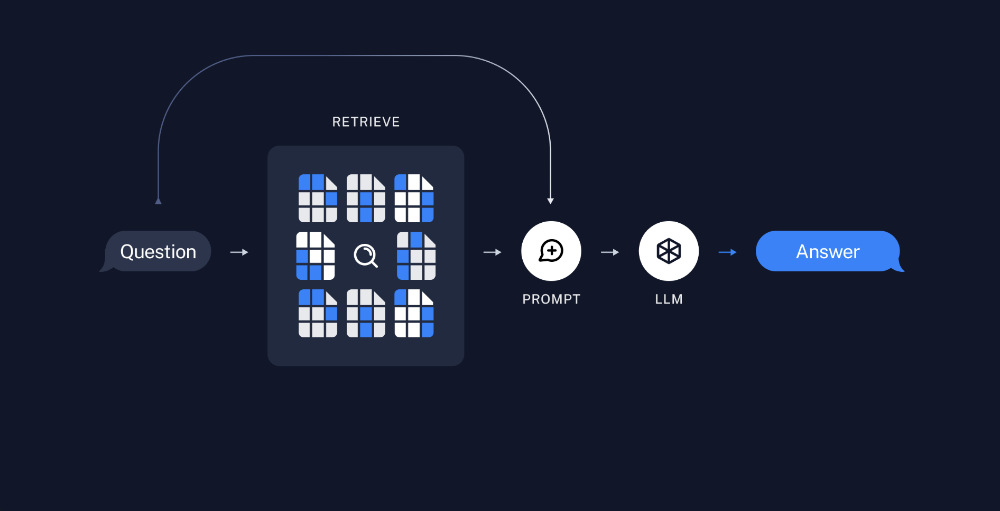

In [33]:
llm = ChatOpenAI(model="gpt-4o")

In [63]:
### PROMPTS
from langchain_core.prompts import ChatPromptTemplate

# Prompt Template allows you to create a blueprint for your prompt so that chat gpt follows the similar response structure
# and has the right information every time! As you can see, we can inject variables!
prompt = ChatPromptTemplate.from_template(
  """
  You are an assistant for question-answering tasks. Use the following pieces of retrieved context to answer the question. Try your best to answer all questions.
  Question: {question} 
  Context: {context} 
  Answer:
  """
)

# A chain is just a lanchain way of passing information in one direction. For example, question -> prompt -> llm -> output
chain = prompt | llm 

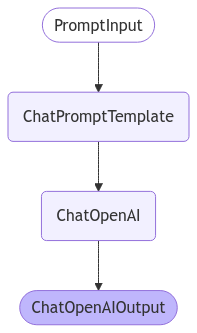

In [64]:
from IPython.display import Image, display
from langchain_core.runnables.graph import MermaidDrawMethod

display(
    Image(
        chain.get_graph().draw_mermaid_png(
            draw_method=MermaidDrawMethod.API,
        )
    )
)

A chain in Langchain is information that flows only ONE WAY:

```query -> prompt -> llm -> output```

In [54]:
# this is how to invoke the chain!
print(chain.invoke({"question": "test question", "context": "text_context"}))

content="I'm sorry, but the context provided does not contain sufficient information to answer the test question. Could you please provide more specific details or context for a more accurate response?" additional_kwargs={'refusal': None} response_metadata={'token_usage': {'completion_tokens': 33, 'prompt_tokens': 55, 'total_tokens': 88, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 0, 'rejected_prediction_tokens': 0}, 'prompt_tokens_details': {'audio_tokens': 0, 'cached_tokens': 0}}, 'model_name': 'gpt-4o-2024-08-06', 'system_fingerprint': 'fp_7f6be3efb0', 'finish_reason': 'stop', 'logprobs': None} id='run-06514a3e-5d47-4181-a730-5ecc2b650584-0' usage_metadata={'input_tokens': 55, 'output_tokens': 33, 'total_tokens': 88, 'input_token_details': {'audio': 0, 'cache_read': 0}, 'output_token_details': {'audio': 0, 'reasoning': 0}}


The chat contains several instances of humor and light-hearted banter among the participants. Here are some of the funniest exchanges:

1. **Refresh Obsession**: Sualeh Syed expressed relief when the chat reopened, and Rameez R humorously accused him of staring at the chat waiting for it to open, with Tahir adding that Sualeh was probably refreshing his screen.

2. **Freedom of Speech Joke**: Muhammad Shayan Waqar jokingly mentioned "Freedom of speech or smth," after Sualeh Syed hinted he had something to say but feared getting muted, prompting Ifaz Howlader to request direct messages for more laughter.

3. **CSGO Valid**: Mirza Zuhayr found humor in a conversation about CSGO (Counter-Strike: Global Offensive), emphasizing how funny the context was.

4. **Twerking Banter**: A humorous exchange involved Yusuf Quadri remarking, "this chat getting too gay now smh," followed by Fahiyeen's playful prohibition of "No twerking allowed," which led to a light-hearted discussion about who might 

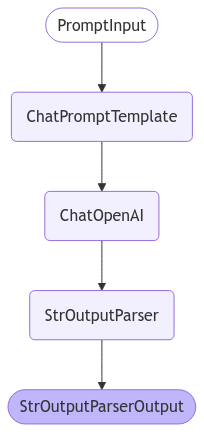

In [58]:
from langchain_core.output_parsers import StrOutputParser


rag_chain = (
  prompt | llm | StrOutputParser()
)

def chat(question):
  relevant_chunks = retriever.invoke(question)
  return rag_chain.stream({"question": question, "context": relevant_chunks})

chat_stream_object = chat("What was some of the funniest things said in the chat")

for chunk in chat_stream_object:
    print(chunk, end="", flush=True) 

display(
    Image(
        rag_chain.get_graph().draw_mermaid_png(
            draw_method=MermaidDrawMethod.API,
        )
    )
)

## A More LangChain Way to Create The RAG Chain
We don't have to FIRST get context and THEN input question

Since these getting the context and inputing the question are two separate operations, we can easily paralellize this! 

![image copy 8.png](<attachment:image copy 8.png>)

![image copy 2.png](<attachment:image copy 2.png>)
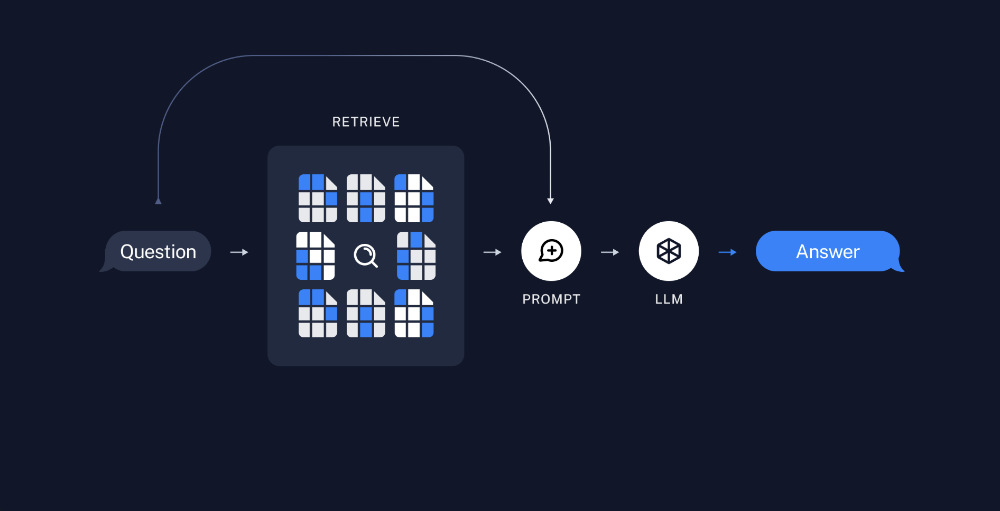
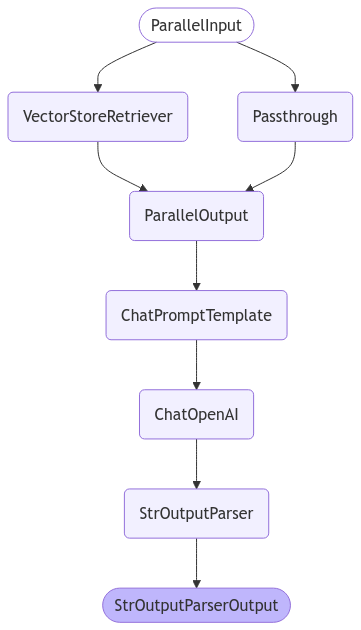

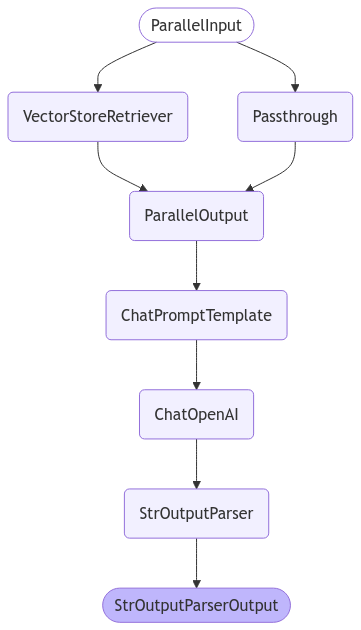

In [60]:
rag_chain = (
    {"context": retriever, "question": RunnablePassthrough()}
    | prompt
    | llm
    | StrOutputParser()
)

display(
    Image(
        rag_chain.get_graph().draw_mermaid_png(
            draw_method=MermaidDrawMethod.API,
        )
    )
)

In [62]:
rag_chain.invoke("Who is Lemon Pepper Hoom?")

'The context does not provide a direct answer to who "Lemon Pepper Hoom" is. However, it appears that "Lemon Pepper Hoom" is a participant in various group chats, often engaging in casual conversation with other members. The name might be a username or a nickname used by one of the participants in these chats, but the context does not reveal more specific information about their identity beyond their interactions.'

# Easter Egg!

![image copy 10.png](<attachment:image copy 10.png>)
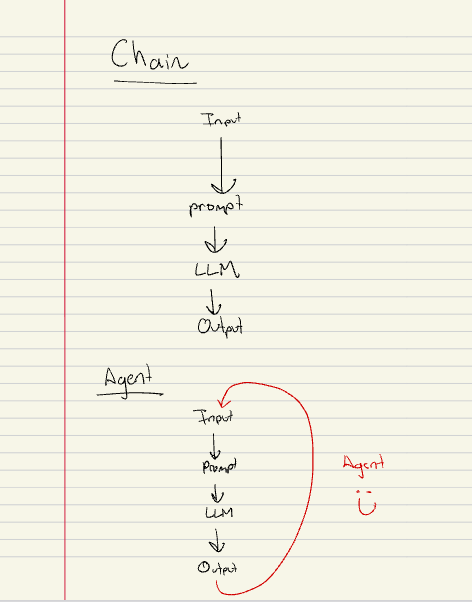

# We have reached the end! 🎉🎉🎉